In [1]:
import os
import numpy as np
import pickle
import warnings
warnings.filterwarnings("ignore")
import matplotlib
matplotlib.use('Qt5Agg')
import matplotlib.pyplot as plt
from matplotlib import gridspec
plt.ion()
import pandas as pd
from datetime import datetime
from coastsat import SDS_download, SDS_preprocess, SDS_shoreline, SDS_tools, SDS_transects

In [2]:
import ee
ee.Authenticate()
ee.Initialize(project='finalproject24')
print(ee.Image("NASA/NASADEM_HGT/001").get("title").getInfo())

NASADEM: NASA NASADEM Digital Elevation 30m


In [3]:
Kailua = [[[-157.73307986996033, 21.428546327353313],
          [-157.76260562679627, 21.408730390969364],
          [-157.71660037777283, 21.35374308536363],
          [-157.6877612664447, 21.3748453081883]]]

polygon = SDS_tools.smallest_rectangle(Kailua)
# Date range
dates = ['1990-01-01', '2024-01-01']
# sat_list = ['L5','L7','L8','L9']
sat_list = ['L5','L8','L9']
collection = 'C02'
sitename = 'KAILUA_landsat_1990to2024'
filepath = os.path.join(os.getcwd(),'data')
inputs = {'polygon': polygon, 'dates': dates, 'sat_list': sat_list, 'sitename': sitename, 'filepath':filepath, 'landsat_collection': collection }

In [79]:
SDS_download.check_images_available(inputs)

Number of images available between 1990-01-01 and 2024-01-01:
- In Landsat Tier 1 & Sentinel-2 Level-1C:
     L5: 8 images
     L7: 575 images
     L8: 237 images
     L9: 48 images
  Total to download: 868 images
L8: 24 images already exist, 213 to download
- In Landsat Tier 2 (not suitable for time-series analysis):
     L5: 0 images
     L7: 12 images
     L8: 3 images
  Total Tier 2: 15 images


({'L5': [{'type': 'Image',
    'bands': [{'id': 'B1',
      'data_type': {'type': 'PixelType', 'precision': 'float'},
      'dimensions': [7711, 6941],
      'crs': 'EPSG:32604',
      'crs_transform': [30, 0, 570885, 0, -30, 2501715]},
     {'id': 'B2',
      'data_type': {'type': 'PixelType', 'precision': 'float'},
      'dimensions': [7711, 6941],
      'crs': 'EPSG:32604',
      'crs_transform': [30, 0, 570885, 0, -30, 2501715]},
     {'id': 'B3',
      'data_type': {'type': 'PixelType', 'precision': 'float'},
      'dimensions': [7711, 6941],
      'crs': 'EPSG:32604',
      'crs_transform': [30, 0, 570885, 0, -30, 2501715]},
     {'id': 'B4',
      'data_type': {'type': 'PixelType', 'precision': 'float'},
      'dimensions': [7711, 6941],
      'crs': 'EPSG:32604',
      'crs_transform': [30, 0, 570885, 0, -30, 2501715]},
     {'id': 'B5',
      'data_type': {'type': 'PixelType', 'precision': 'float'},
      'dimensions': [7711, 6941],
      'crs': 'EPSG:32604',
      'crs_transf

In [80]:
# Do only once
metadata = SDS_download.retrieve_images(inputs)

Number of images available between 1990-01-01 and 2024-01-01:
- In Landsat Tier 1 & Sentinel-2 Level-1C:
     L5: 8 images
     L7: 575 images
     L8: 237 images
     L9: 48 images
  Total to download: 868 images
L8: 24 images already exist, 213 to download
- In Landsat Tier 2 (not suitable for time-series analysis):
     L5: 0 images
     L7: 12 images
     L8: 3 images
  Total Tier 2: 15 images

L5: 8 images
100%
L7: 575 images
100%
L8: 213 images
100%
L9: 48 images
100%
Satellite images downloaded from GEE and save in c:\Users\amyca\OneDrive\Documents\GTECH713_AdvancedImageProcessing\pythonGEE\data\KAILUA_landsat_2022to2024


In [4]:
metadata_download = SDS_download.get_metadata(inputs)

# Shoreline Extraction

In [5]:
settings = {
    'cloud_thresh': 0.1,
    's2cloudless_prob': 60,
    'dist_clouds': 300,
    # espg change!!!
    'output_epsg': 26963,
    #'output espg': 4326,
    'check_detection': True,
    'adjust_detection': False,
    'save_figure': True,
    'min_beach_area': 1000,
    'min_beach_size': 1000,
    'min_length_sl': 500,
    'cloud_mask_issue': False,
    'sand_color': 'bright',
    'pan_off': False,
    'inputs': inputs,
}

In [16]:
# Optional
SDS_preprocess.save_jpg(metadata_download, settings, use_matplotlib=True)

Saving images as jpg:
L5: 8 images
100%
L7: 575 images
100%
L8: 237 images
100%
L9: 48 images
100%
Satellite images saved as .jpg in c:\Users\amyca\OneDrive\Documents\GTECH713_AdvancedImageProcessing\pythonGEE\data\KAILUA_landsat_1990to2024\jpg_files\preprocessed


In [18]:
# Optional
# Create mp4 animation
fn_animation = os.path.join(inputs['filepath'], inputs['sitename'], '%s_animation_RGB.mp4'%inputs['sitename'])
fp_images = os.path.join(inputs['filepath'], inputs['sitename'], 'jpg_files','preprocessed')
fps = 4
SDS_tools.make_animation_mp4(fp_images, fps, fn_animation)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (2700, 1350) to (2704, 1360) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


Animation has been generated (using 4 frames per second) and saved at c:\Users\amyca\OneDrive\Documents\GTECH713_AdvancedImageProcessing\pythonGEE\data\KAILUA_landsat_1990to2024\KAILUA_landsat_1990to2024_animation_RGB.mp4


In [6]:
# Save reference shoreline
#%matplotlib qt
settings['reference_shoreline'] = SDS_preprocess.get_reference_sl(metadata_download, settings)
settings['max_dist_ref'] = 100 # max distance (in meters) allowed from the reference shoreline

Reference shoreline already exists and was loaded
Reference shoreline coordinates are in epsg:26963


## Batch Shoreline Detection

In [14]:
output = SDS_shoreline.extract_shorelines(metadata_download, settings)

Mapping shorelines:
L5:   100%
L7:   100%
L8:   100%
L9:   100%


In [15]:
# remove duplicates (images taken on the same date by the same satellite)
output = SDS_tools.remove_duplicates(output)
# remove inaccurate georeferencing (set threshold to 10 m)
output = SDS_tools.remove_inaccurate_georef(output, 10)

0 duplicates
0 bad georef


In [16]:
from pyproj import CRS
geomtype = 'points' # choose 'points' or 'lines' for the layer geometry
gdf = SDS_tools.output_to_gdf(output, geomtype)
if gdf is None:
    raise Exception("output does not contain any mapped shorelines")
gdf.crs = CRS(settings['output_epsg']) # set layer projection
# save GEOJSON layer to file
gdf.to_file(os.path.join(inputs['filepath'], inputs['sitename'], '%s_output_%s.geojson'%(sitename,geomtype)),
                                driver='GeoJSON', encoding='utf-8')

In [25]:
# DON'T NEED
# create MP4 timelapse animation
fn_animation = os.path.join(inputs['filepath'],inputs['sitename'], '%s_animation_shorelines.mp4'%inputs['sitename'])
fp_images = os.path.join(inputs['filepath'], inputs['sitename'], 'jpg_files', 'detection')
fps = 4 # frames per second in animation
SDS_tools.make_animation_mp4(fp_images, fps, fn_animation)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (5760, 2868) to (5760, 2880) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


Animation has been generated (using 4 frames per second) and saved at c:\Users\amyca\OneDrive\Documents\GTECH713_AdvancedImageProcessing\pythonGEE\data\KAILUA_landsat_1990to2024\KAILUA_landsat_1990to2024_animation_shorelines.mp4


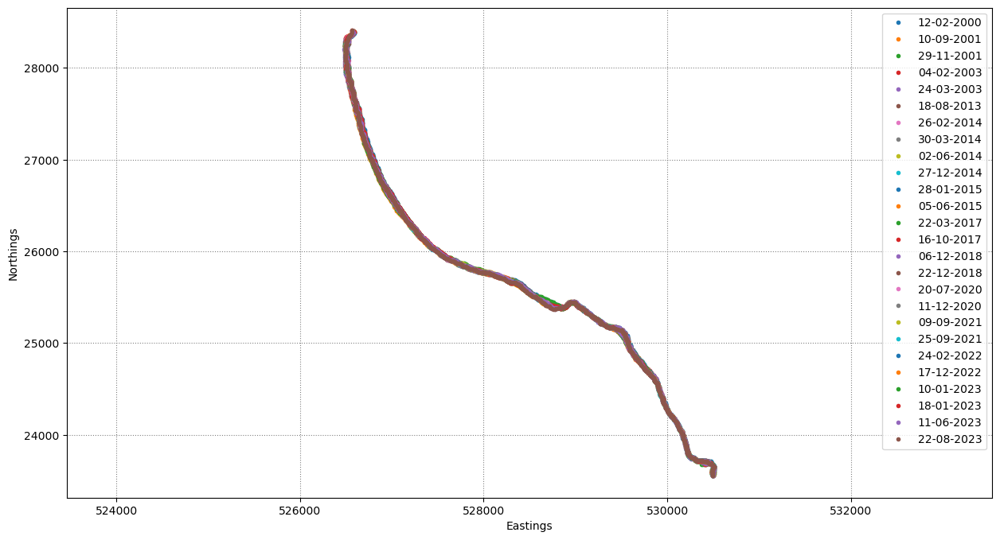

In [17]:
%matplotlib inline
fig = plt.figure(figsize=[15,8])
plt.axis('equal')
plt.xlabel('Eastings')
plt.ylabel('Northings')
plt.grid(linestyle=':', color='0.5')
for i in range(len(output['shorelines'])):
    sl = output['shorelines'][i]
    date = output['dates'][i]
    plt.plot(sl[:,0], sl[:,1], '.', label=date.strftime('%d-%m-%Y'))
plt.legend()

3. Shoreline Analysis

In [18]:
filepath = os.path.join(inputs['filepath'], sitename)
with open(os.path.join(filepath, sitename + '_output' + '.pkl'), 'rb') as f:
    output = pickle.load(f)
# remove duplicates (images taken on the same date by the same satellite)
output = SDS_tools.remove_duplicates(output)
# remove inaccurate georeferencing (set threshold to 10 m)
output = SDS_tools.remove_inaccurate_georef(output, 10)

0 duplicates
0 bad georef


In [9]:
# Option 1: the user can interactively draw the shore-normal transects along the beach by calling:
# %matplotlib qt
transects = SDS_transects.draw_transects(output, settings)
transects = SDS_tools.transects_from_geojson()

KeyboardInterrupt: 

In [22]:
# dont run?
fig = plt.figure(figsize=[15,8], tight_layout=True)
plt.axis('equal')
plt.xlabel('Eastings')
plt.ylabel('Northings')
plt.grid(linestyle=':', color='0.5')
for i in range(len(output['shorelines'])):
    sl = output['shorelines'][i]
    date = output['dates'][i]
    plt.plot(sl[:,0], sl[:,1], '.', label=date.strftime('%d-%m-%Y'))
for i,key in enumerate(list(transects.keys())):
    plt.plot(transects[key][0,0],transects[key][0,1], 'bo', ms=5)
    plt.plot(transects[key][:,0],transects[key][:,1],'k-',lw=1)
    plt.text(transects[key][0,0]-100, transects[key][0,1]+100, key,
                va='center', ha='right', bbox=dict(boxstyle="square", ec='k',fc='w'))

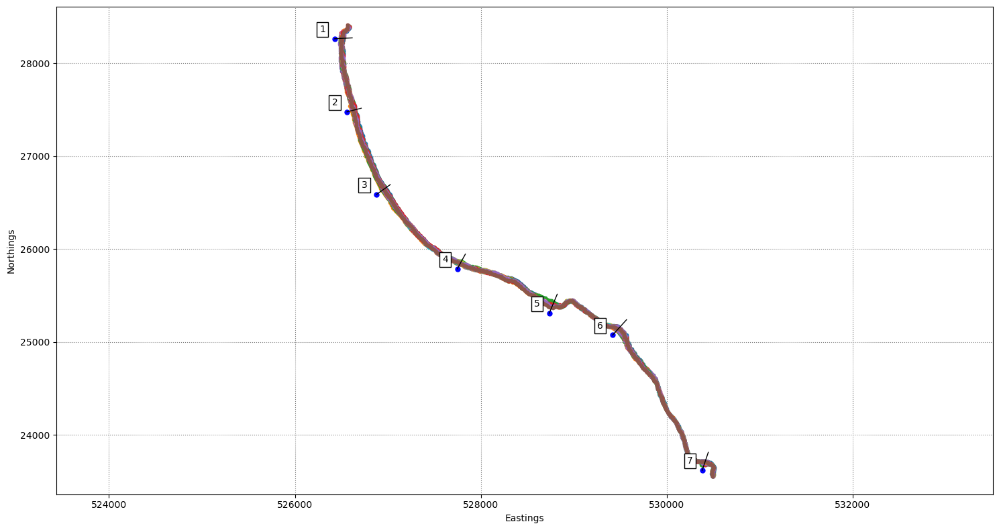

In [23]:
plt.figure(1)

In [24]:
# along-shore distance over which to consider shoreline points to compute the median intersection
settings_transects = {'along_dist':25}
cross_distance = SDS_transects.compute_intersection(output, transects, settings_transects) 

In [25]:
settings_transects = { # parameters for computing intersections
                      'along_dist':          25,        # along-shore distance to use for computing the intersection
                      'min_points':          3,         # minimum number of shoreline points to calculate an intersection
                      'max_std':             15,        # max std for points around transect
                      'max_range':           30,        # max range for points around transect
                      'min_chainage':        -100,      # largest negative value along transect (landwards of transect origin)
                      'multiple_inter':      'auto',    # mode for removing outliers ('auto', 'nan', 'max')
                      'auto_prc':            0.1,       # percentage of the time that multiple intersects are present to use the max
                     }
cross_distance = SDS_transects.compute_intersection_QC(output, transects, settings_transects) 

In [26]:
# Plot the time-series of shoreline change along each transect
fig = plt.figure(figsize=[15,8], tight_layout=True)
gs = gridspec.GridSpec(len(cross_distance),1)
gs.update(left=0.05, right=0.95, bottom=0.05, top=0.95, hspace=0.05)
for i,key in enumerate(cross_distance.keys()):
    if np.all(np.isnan(cross_distance[key])):
        continue
    ax = fig.add_subplot(gs[i,0])
    ax.grid(linestyle=':', color='0.5')
    ax.plot(output['dates'], cross_distance[key], '-o', ms=6, mfc='w')
    ax.set_ylabel('distance [m]', fontsize=12)
    ax.text(0.5,0.95, key, bbox=dict(boxstyle="square", ec='k',fc='w'), ha='center',
            va='top', transform=ax.transAxes, fontsize=14)  

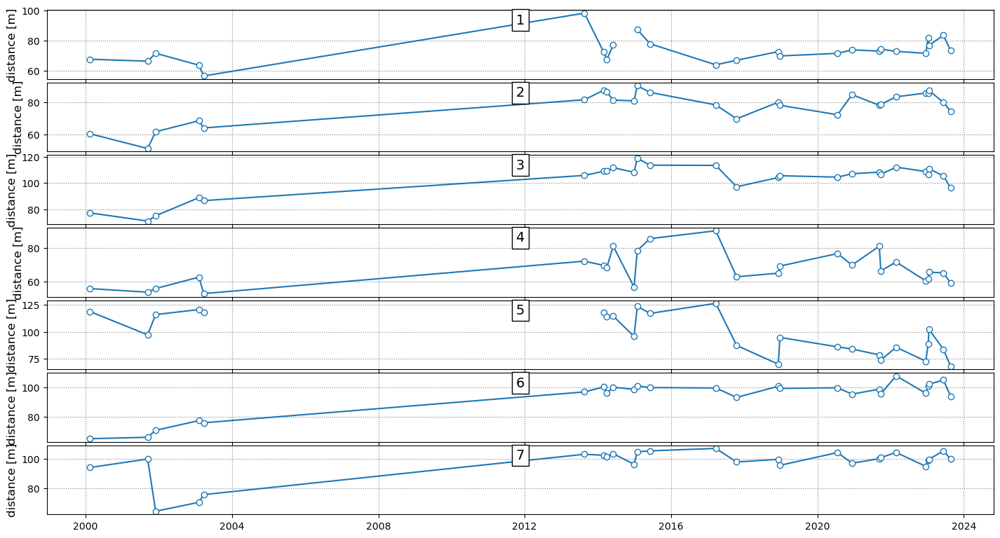

In [28]:
plt.figure(2)

In [29]:
# save a .csv file for Excel users
out_dict = dict([])
out_dict['dates'] = output['dates']
for key in transects.keys():
    out_dict[key] = cross_distance[key]
df = pd.DataFrame(out_dict)
fn = os.path.join(settings['inputs']['filepath'],settings['inputs']['sitename'],
                  'transect_time_series.csv')
df.to_csv(fn, sep=',')
print('Time-series of the shoreline change along the transects saved as:\n%s'%fn)

Time-series of the shoreline change along the transects saved as:
c:\Users\amyca\OneDrive\Documents\GTECH713_AdvancedImageProcessing\pythonGEE\data\KAILUA_landsat_1990to2024\transect_time_series.csv


# 4. Tidal Correction

In [10]:
print(output['dates'])

[datetime.datetime(2000, 2, 12, 20, 46, 47, tzinfo=<UTC>), datetime.datetime(2001, 9, 10, 20, 42, 38, tzinfo=<UTC>), datetime.datetime(2001, 11, 29, 20, 42, 36, tzinfo=<UTC>), datetime.datetime(2003, 2, 4, 20, 42, 40, tzinfo=<UTC>), datetime.datetime(2003, 3, 24, 20, 42, 41, tzinfo=<UTC>), datetime.datetime(2013, 8, 18, 20, 56, 5, tzinfo=<UTC>), datetime.datetime(2014, 2, 26, 20, 54, 45, tzinfo=<UTC>), datetime.datetime(2014, 3, 30, 20, 54, 17, tzinfo=<UTC>), datetime.datetime(2014, 6, 2, 20, 53, 41, tzinfo=<UTC>), datetime.datetime(2014, 12, 27, 20, 54, 8, tzinfo=<UTC>), datetime.datetime(2015, 1, 28, 20, 54, 1, tzinfo=<UTC>), datetime.datetime(2015, 6, 5, 20, 53, 15, tzinfo=<UTC>), datetime.datetime(2017, 3, 22, 20, 53, 41, tzinfo=<UTC>), datetime.datetime(2017, 10, 16, 20, 54, 21, tzinfo=<UTC>), datetime.datetime(2018, 12, 6, 20, 53, 57, tzinfo=<UTC>), datetime.datetime(2018, 12, 22, 20, 53, 56, tzinfo=<UTC>), datetime.datetime(2020, 7, 20, 20, 53, 57, tzinfo=<UTC>), datetime.dateti

In [11]:
# Amy Change
from datetime import datetime
# Assuming output['dates'] is a list of datetime objects
naive_dates = [dt.replace(tzinfo=None) for dt in output['dates']]
print(naive_dates)

[datetime.datetime(2000, 2, 12, 20, 46, 47), datetime.datetime(2001, 9, 10, 20, 42, 38), datetime.datetime(2001, 11, 29, 20, 42, 36), datetime.datetime(2003, 2, 4, 20, 42, 40), datetime.datetime(2003, 3, 24, 20, 42, 41), datetime.datetime(2013, 8, 18, 20, 56, 5), datetime.datetime(2014, 2, 26, 20, 54, 45), datetime.datetime(2014, 3, 30, 20, 54, 17), datetime.datetime(2014, 6, 2, 20, 53, 41), datetime.datetime(2014, 12, 27, 20, 54, 8), datetime.datetime(2015, 1, 28, 20, 54, 1), datetime.datetime(2015, 6, 5, 20, 53, 15), datetime.datetime(2017, 3, 22, 20, 53, 41), datetime.datetime(2017, 10, 16, 20, 54, 21), datetime.datetime(2018, 12, 6, 20, 53, 57), datetime.datetime(2018, 12, 22, 20, 53, 56), datetime.datetime(2020, 7, 20, 20, 53, 57), datetime.datetime(2020, 12, 11, 20, 54, 24), datetime.datetime(2021, 9, 9, 20, 54, 19), datetime.datetime(2021, 9, 25, 20, 54, 23), datetime.datetime(2022, 2, 24, 20, 54, 9), datetime.datetime(2022, 12, 17, 20, 54, 30), datetime.datetime(2023, 1, 10, 20

In [32]:
len(naive_dates)

26

In [33]:
# load the measured tide data
filepath = os.path.join(os.getcwd(),'examples','2000to2024.csv') # EDIT
tide_data = pd.read_csv(filepath)
dates_ts = [pd.to_datetime(_).to_pydatetime() for _ in tide_data['dates']]
tides_ts = np.array(tide_data['tide'])

# get tide levels corresponding to the time of image acquisition
# Amy change
# dates_sat = output['dates']
dates_sat = naive_dates
tides_sat = SDS_tools.get_closest_datapoint(dates_sat, dates_ts, tides_ts)

# plot the subsampled tide data
fig, ax = plt.subplots(1,1,figsize=(15,4), tight_layout=True)
ax.grid(which='major', linestyle=':', color='0.5')
ax.plot(dates_ts, tides_ts, '-', color='0.6', label='all time-series')
ax.plot(dates_sat, tides_sat, '-o', color='k', ms=6, mfc='w',lw=1, label='image acquisition')
ax.set(ylabel='tide level [m]',xlim=[dates_sat[0],dates_sat[-1]], title='Water levels at the time of image acquisition');
ax.legend();

Extracting closest points: 100%

In [34]:
#tide_data = pd.read_csv(filepath)
print(tide_data['dates'])

0          2000-01-01 00:00:00
1          2000-01-01 00:06:00
2          2000-01-01 00:12:00
3          2000-01-01 00:18:00
4          2000-01-01 00:24:00
                  ...         
2101090    2023-12-31 23:36:00
2101091    2023-12-31 23:42:00
2101092    2023-12-31 23:48:00
2101093    2023-12-31 23:54:00
2101094    2024-01-01 00:00:00
Name: dates, Length: 2101095, dtype: object


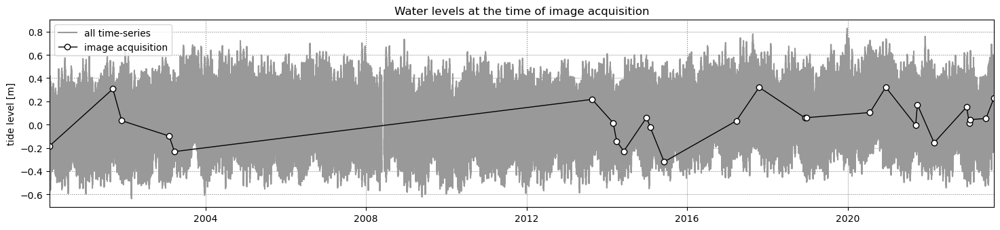

In [35]:
plt.figure(4)

In [36]:
# tidal correction along each transect
reference_elevation = 0 # elevation at which you would like the shoreline time-series to be
beach_slope = 0.1
cross_distance_tidally_corrected = {}
for key in cross_distance.keys():
    correction = (tides_sat-reference_elevation)/beach_slope
    cross_distance_tidally_corrected[key] = cross_distance[key] + correction
    
# store the tidally-corrected time-series in a .csv file
out_dict = dict([])
out_dict['dates'] = dates_sat
for key in cross_distance_tidally_corrected.keys():
    out_dict[key] = cross_distance_tidally_corrected[key]
df = pd.DataFrame(out_dict)
fn = os.path.join(settings['inputs']['filepath'],settings['inputs']['sitename'],
                  'transect_time_series_tidally_corrected.csv')
df.to_csv(fn, sep=',')
print('Tidally-corrected time-series of the shoreline change along the transects saved as:\n%s'%fn)

# plot the time-series of shoreline change (both raw and tidally-corrected)
fig = plt.figure(figsize=[15,8], tight_layout=True)
gs = gridspec.GridSpec(len(cross_distance),1)
gs.update(left=0.05, right=0.95, bottom=0.05, top=0.95, hspace=0.05)
for i,key in enumerate(cross_distance.keys()):
    if np.all(np.isnan(cross_distance[key])):
        continue
    ax = fig.add_subplot(gs[i,0])
    ax.grid(linestyle=':', color='0.5')
    ax.plot(output['dates'], cross_distance[key], '-o', ms=6, mfc='w', label='raw')
    ax.plot(output['dates'], cross_distance_tidally_corrected[key], '-o', ms=6, mfc='w', label='tidally-corrected')
    ax.set_ylabel('distance [m]', fontsize=12)
    ax.text(0.5,0.95, key, bbox=dict(boxstyle="square", ec='k',fc='w'), ha='center',
            va='top', transform=ax.transAxes, fontsize=14)
ax.legend();

Tidally-corrected time-series of the shoreline change along the transects saved as:
c:\Users\amyca\OneDrive\Documents\GTECH713_AdvancedImageProcessing\pythonGEE\data\KAILUA_landsat_1990to2024\transect_time_series_tidally_corrected.csv


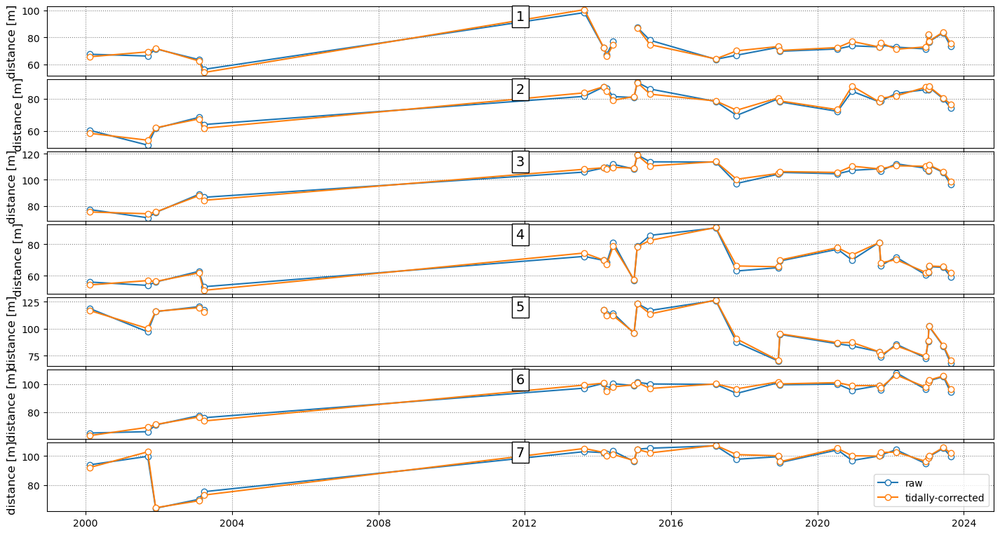

In [37]:
plt.figure(5)

# 5. Time series post processing

In [7]:
# Load mapped shorelines from 1990
filename_output = os.path.join(os.getcwd(),'examples','KAILUA_landsat_1990to2024_output.pkl') #Edit
with open(filename_output, 'rb') as f:
    output = pickle.load(f) 


NameError: name 'transects' is not defined

In [8]:
# plot the mapped shorelines
fig = plt.figure(figsize=[15,8], tight_layout=True)
plt.axis('equal')
plt.xlabel('Eastings')
plt.ylabel('Northings')
plt.grid(linestyle=':', color='0.5')
plt.title('%d shorelines mapped at Kailua from 1990'%len(output['shorelines']))
for i in range(len(output['shorelines'])):
    sl = output['shorelines'][i]
    date = output['dates'][i]
    plt.plot(sl[:,0], sl[:,1], '.', label=date.strftime('%d-%m-%Y'))
for i,key in enumerate(list(transects.keys())):
    plt.plot(transects[key][0,0],transects[key][0,1], 'bo', ms=5)
    plt.plot(transects[key][:,0],transects[key][:,1],'k-',lw=1)
    plt.text(transects[key][0,0]-100, transects[key][0,1]+100, key,
             va='center', ha='right', bbox=dict(boxstyle="square", ec='k',fc='w'))

# load long time-series (1990-2023)
filepath = os.path.join(os.getcwd(),'examples','transect_time_series_tidally_corrected.csv') #Edit
df = pd.read_csv(filepath, parse_dates=['dates'])
dates = [_.to_pydatetime() for _ in df['dates']]
cross_distance = dict([])
for key in transects.keys():
    cross_distance[key] = np.array(df[key])

NameError: name 'transects' is not defined

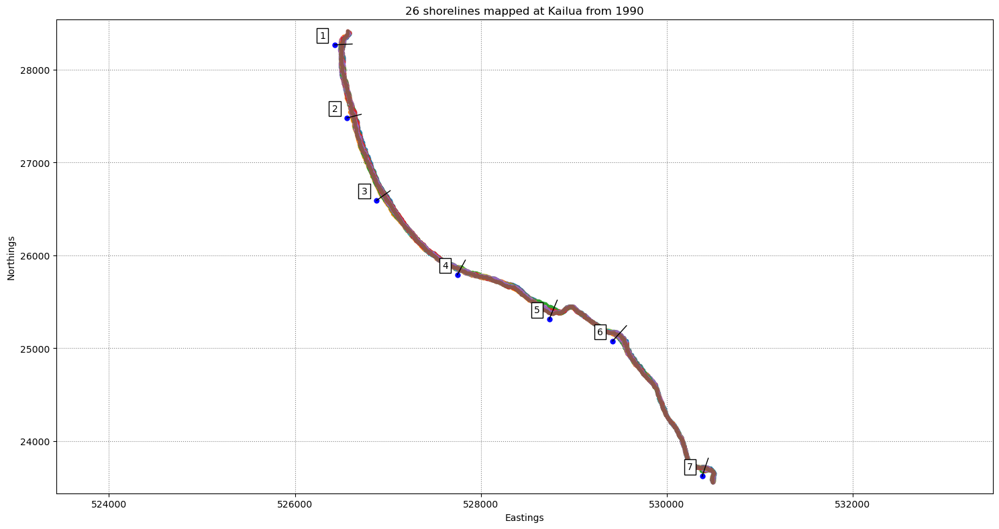

In [44]:
from matplotlib import pyplot as plt
# plt.isinteractive()
plt.figure(7)

5.1 Despiking the time-series

In [45]:
# remove outliers in the time-series (coastal despiking)
settings_outliers = {'max_cross_change':   40,             # maximum cross-shore change observable between consecutive timesteps
                     'otsu_threshold':     [-.5,0],        # min and max intensity threshold use for contouring the shoreline
                     'plot_fig':           True,           # whether to plot the intermediate steps
                    }
cross_distance = SDS_transects.reject_outliers(cross_distance,output,settings_outliers)

In [46]:
# plot Otsu thresholds for the mapped shorelines
fig,ax = plt.subplots(1,1,figsize=[12,5],tight_layout=True)
ax.grid(which='major',ls=':',lw=0.5,c='0.5')
ax.plot(output['dates'],output['MNDWI_threshold'],'o-',mfc='w')
ax.axhline(y=-0.5,ls='--',c='r',label='otsu_threshold limits')
ax.axhline(y=0,ls='--',c='r')
ax.set(title='Otsu thresholds on MNDWI for the %d shorelines mapped'%len(output['shorelines']),
       ylim=[-0.6,0.2],ylabel='otsu threshold')
ax.legend(loc='upper left')
fig.savefig(os.path.join(inputs['filepath'], inputs['sitename'], 'otsu_threhsolds.jpg'))

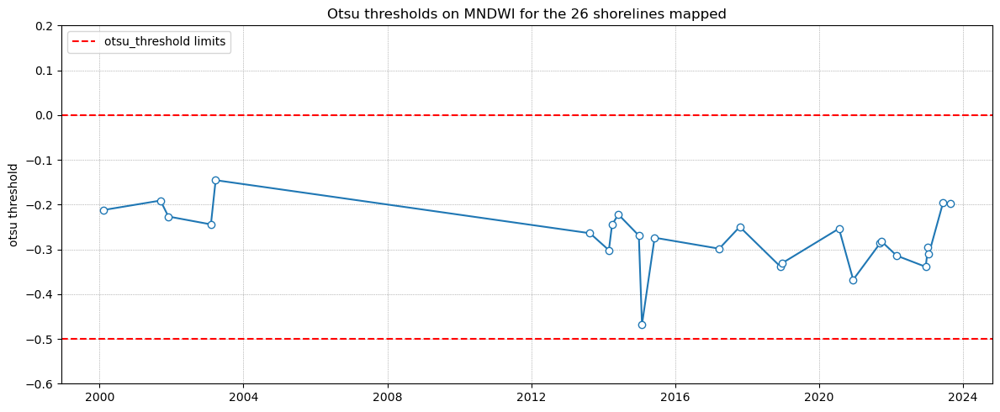

In [48]:
plt.figure(9)

# 5.2 Seasonal Averaging and long term trends

In [ ]:
season_colors = {'DJF':'C3', 'MAM':'C1', 'JJA':'C2', 'SON':'C0'}
for key in cross_distance.keys():
    chainage = cross_distance[key]
    # remove nans
    idx_nan = np.isnan(chainage)
    dates_nonan = [dates[_] for _ in np.where(~idx_nan)[0]]
    chainage = chainage[~idx_nan] 
    
    # compute shoreline seasonal averages (DJF, MAM, JJA, SON)
    dict_seas, dates_seas, chainage_seas, list_seas = SDS_transects.seasonal_average(dates_nonan, chainage)
    
    # calculate long-term trend
    trend, y =  SDS_transects.calculate_trend(dates_seas, chainage_seas)
    
    # plot seasonal averages
    fig,ax=plt.subplots(1,1,figsize=[14,4],tight_layout=True)
    ax.grid(which='major', linestyle=':', color='0.5')
    ax.set_title('Time-series at %s'%key, x=0, ha='left')
    ax.set(ylabel='distance [m]')
    ax.plot(dates_nonan, chainage,'+', lw=1, color='k', mfc='w', ms=4, alpha=0.5,label='raw datapoints')
    ax.plot(dates_seas, chainage_seas, '-', lw=1, color='k', mfc='w', ms=4, label='seasonally-averaged')
    for k,seas in enumerate(dict_seas.keys()):
        ax.plot(dict_seas[seas]['dates'], dict_seas[seas]['chainages'],
                 'o', mec='k', color=season_colors[seas], label=seas,ms=5)
    ax.plot(dates_seas,y,'--',color='b', label='trend %.1f m/year'%trend)
    ax.legend(loc='lower left',ncol=7,markerscale=1.5,frameon=True,edgecolor='k',columnspacing=1)


In [ ]:
plt.figure(34)


In [77]:
# Monthly graphs (not working)
month_colors = plt.cm.get_cmap('tab20')
for key in cross_distance.keys():
    chainage = cross_distance[key]
    # remove nans
    idx_nan = np.isnan(chainage)
    dates_nonan = [dates[_] for _ in np.where(~idx_nan)[0]]
    chainage = chainage[~idx_nan] 
    
    # compute shoreline monthly averages
    dict_month, dates_month, chainage_month, list_month = SDS_transects.monthly_average(dates_nonan, chainage)
    
    # plot monthly averages
    fig,ax=plt.subplots(1,1,figsize=[14,4],tight_layout=True)
    ax.grid(which='major', linestyle=':', color='0.5')
    ax.set_title('Time-series at %s'%key, x=0, ha='left')
    ax.set(ylabel='distance [m]')
    ax.plot(dates_nonan, chainage,'+', lw=1, color='k', mfc='w', ms=4, alpha=0.5,label='raw datapoints')
    ax.plot(dates_month, chainage_month, '-', lw=1, color='k', mfc='w', ms=4, label='monthly-averaged')
    for k,month in enumerate(dict_month.keys()):
        ax.plot(dict_month[month]['dates'], dict_month[month]['chainages'],
                 'o', mec='k', color=month_colors(k), label=month,ms=5)
    ax.legend(loc='lower left',ncol=7,markerscale=1.5,frameon=True,edgecolor='k',columnspacing=1)

TypeError: can't compare offset-naive and offset-aware datetimes

: 

In [58]:
plt.figure(24)

<Figure size 640x480 with 0 Axes>